<a href="https://colab.research.google.com/github/iamRahulB/Pytorch-practice/blob/main/CNN/Experiment_tracking_on_CNN_Pytorch_with_tensorboard_acucracy_96_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import pandas as pd
import torch
from torch import nn
import torchvision
from torchvision import datasets,transforms
from torch.utils.data import DataLoader
import numpy as np
import requests
from zipfile import ZipFile
import os
import torch.optim as optim
from torchvision.datasets import ImageFolder

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score,classification_report
import numpy
from tqdm.auto import tqdm
from torch.utils.tensorboard import SummaryWriter


In [5]:


data_links={'20_per':'https://github.com/mrdbourke/pytorch-deep-learning/raw/refs/heads/main/data/pizza_steak_sushi_20_percent.zip',
            "10_per":"https://github.com/mrdbourke/pytorch-deep-learning/raw/refs/heads/main/data/pizza_steak_sushi.zip"}

In [6]:
for key,val in data_links.items():
  response=requests.get(val)
  with open(key+'.zip','wb') as f_write:
    f_write.write(response.content)

  with ZipFile(key+'.zip') as f_ref:
    f_ref.extractall(key)

In [7]:
for i in data_links.keys():
  for path,dir,files in os.walk(i):
    print(f"{path} has images : {len(files)}")

20_per has images : 0
20_per/test has images : 0
20_per/test/steak has images : 58
20_per/test/pizza has images : 46
20_per/test/sushi has images : 46
20_per/train has images : 0
20_per/train/steak has images : 146
20_per/train/pizza has images : 154
20_per/train/sushi has images : 150
10_per has images : 0
10_per/test has images : 0
10_per/test/steak has images : 19
10_per/test/pizza has images : 25
10_per/test/sushi has images : 31
10_per/train has images : 0
10_per/train/steak has images : 75
10_per/train/pizza has images : 78
10_per/train/sushi has images : 72


In [9]:
# !pip install -q torchinfo

In [10]:
device=("cuda" if torch.cuda.is_available() else 'cpu')


In [75]:
def train_fn(model,train_data,model_name,path,test_data, epochs: int, batch_size: int, learning_rate: float, device):
  torch.manual_seed(42)
  # print(data)
  # print(train)

  model=model.to(device)

  train_loader=DataLoader(dataset=train_data,batch_size=batch_size,shuffle=True)
  test_loader=DataLoader(dataset=test_data,batch_size=batch_size,shuffle=False)

  loss_fn=nn.CrossEntropyLoss()
  optimizer=optim.Adam(params=model.parameters(),lr=learning_rate)


  values_dict={}

  writer=SummaryWriter(log_dir=f"{model_name}_{path}_{epochs}_{batch_size}_{learning_rate}")

  for epoch in tqdm( range(epochs)):

    train_loss=0
    train_acc=0
    model.train()
    for batch,(X_train,y_train) in enumerate(train_loader):
      X_train,y_train=X_train.to(device),y_train.to(device)
      train_batch_logits=model(X_train)
      train_batch_preds=torch.argmax(torch.softmax(train_batch_logits,dim=1),dim=1)
      train_batch_loss=loss_fn(train_batch_logits,y_train)
      train_batch_acc=accuracy_score(y_train.cpu().numpy(),train_batch_preds.cpu().numpy())

      optimizer.zero_grad()
      train_batch_loss.backward()
      optimizer.step()

      train_loss+=train_batch_loss.item()   # we wil tke only value removing tensor
      train_acc+=train_batch_acc

    train_loss/=len(train_loader)
    train_acc/=len(train_loader)

    model.eval()

    test_loss=0
    test_acc=0
    with torch.inference_mode():
      for X_test,y_test in test_loader:
        X_test,y_test=X_test.to(device),y_test.to(device)
        test_batch_logits=model(X_test)
        test_batch_preds=torch.argmax(torch.softmax(test_batch_logits,dim=1),dim=1)
        test_batch_loss=loss_fn(test_batch_logits,y_test)
        test_batch_acc=accuracy_score(y_test.cpu().numpy(),test_batch_preds.cpu().numpy())

        test_loss+=test_batch_loss.item()
        test_acc+=test_batch_acc

    test_loss/=len(test_loader)
    test_acc/=len(test_loader)

    values_dict['train_loss']=train_loss
    values_dict['test_loss']=test_loss
    values_dict['train_acc']=train_acc
    values_dict['test_acc']=test_acc

    writer.add_scalar('Loss/train', train_loss, epoch)
    writer.add_scalar('Loss/test', test_loss, epoch)
    writer.add_scalar('Accuracy/train', train_acc, epoch)
    writer.add_scalar('Accuracy/test', test_acc, epoch)


    print(f"Epoch: {epoch+1} | Train loss: {train_loss:.4f} | Train acc: {train_acc*100:.2f}% | Test loss: {test_loss:.4f} | Test acc: {test_acc*100:.2f}%")

  writer.close()
  return values_dict,model

In [76]:
def create_model(model_name):

  if model_name=="model_b0":
    weights_b0=torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model_b0=torchvision.models.efficientnet_b0(weights=weights_b0)


    for param in model_b0.features.parameters():
      param.requires_grad=False

    model_b0.classifier[1]=nn.Linear(in_features=1280,out_features=3)

    b0_transform=weights_b0.transforms()


    return model_b0,b0_transform


  if model_name=="model_b1":
    weights_b1=torchvision.models.EfficientNet_B1_Weights.DEFAULT
    model_b1=torchvision.models.efficientnet_b1(weights=weights_b1)


    for param in model_b1.features.parameters():
      param.requires_grad=False

    model_b1.classifier[1]=nn.Linear(in_features=1280,out_features=3)

    b1_transform=weights_b1.transforms()

    return model_b1,b1_transform


In [77]:
import itertools
hyperparams = {
    'models':['model_b0','model_b1'],
    'data':['10_per',"20_per"],
    'epochs': [5, 10, 15],
    'batch_sizes': [4,8],
    'learning_rates': [0.001, 0.01],



}

param_combination=list(itertools.product(hyperparams['models'],hyperparams['data'],hyperparams['epochs'],hyperparams['batch_sizes'],hyperparams['learning_rates']))

In [78]:
param_combination

[('model_b0', '10_per', 5, 4, 0.001),
 ('model_b0', '10_per', 5, 4, 0.01),
 ('model_b0', '10_per', 5, 8, 0.001),
 ('model_b0', '10_per', 5, 8, 0.01),
 ('model_b0', '10_per', 10, 4, 0.001),
 ('model_b0', '10_per', 10, 4, 0.01),
 ('model_b0', '10_per', 10, 8, 0.001),
 ('model_b0', '10_per', 10, 8, 0.01),
 ('model_b0', '10_per', 15, 4, 0.001),
 ('model_b0', '10_per', 15, 4, 0.01),
 ('model_b0', '10_per', 15, 8, 0.001),
 ('model_b0', '10_per', 15, 8, 0.01),
 ('model_b0', '20_per', 5, 4, 0.001),
 ('model_b0', '20_per', 5, 4, 0.01),
 ('model_b0', '20_per', 5, 8, 0.001),
 ('model_b0', '20_per', 5, 8, 0.01),
 ('model_b0', '20_per', 10, 4, 0.001),
 ('model_b0', '20_per', 10, 4, 0.01),
 ('model_b0', '20_per', 10, 8, 0.001),
 ('model_b0', '20_per', 10, 8, 0.01),
 ('model_b0', '20_per', 15, 4, 0.001),
 ('model_b0', '20_per', 15, 4, 0.01),
 ('model_b0', '20_per', 15, 8, 0.001),
 ('model_b0', '20_per', 15, 8, 0.01),
 ('model_b1', '10_per', 5, 4, 0.001),
 ('model_b1', '10_per', 5, 4, 0.01),
 ('model_

In [79]:
# train_data_10=
# test_data_10=

# train_data_20=ImageFolder(root="20_per/train",transform=b1_transform,target_transform=None)
# test_data_20=ImageFolder(root='20_per/test',transform=b1_transform,target_transform=None)


# train_dataloader_10=DataLoader(dataset=train_data_10,batch_size=16,)

In [80]:
def create_data(transform,path):
  train_data=ImageFolder(root=f"{path}/train",transform=transform,target_transform=None)
  test_data=ImageFolder(root=f'{path}/test',transform=transform,target_transform=None)

  return train_data,test_data

In [73]:
results={}
for i in tqdm(param_combination):
  model_name=i[0]
  path=i[1]
  epoch_passed=i[2]
  batch=i[3]
  learn_rate=i[4]

  model,transform=create_model(model_name)


  print(f"Using model: {model_name}, data percentage: {path}, epochs: {epoch_passed}, batches: {batch}, learning rate: {learn_rate}")





  values=train_fn(model=model,model_name=model_name,train_data=train_data,path=path,test_data=test_data,epochs=epoch_passed,batch_size=batch,learning_rate=learn_rate,device=device)
  results[f"{model_name}_{path}_{epoch_passed}_{batch}_{learn_rate}"]=values


  0%|          | 0/48 [00:00<?, ?it/s]

Using model: model_b0, data percentage: 10_per, epochs: 5, batches: 4, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9765 | Train acc: 53.95% | Test loss: 0.7328 | Test acc: 82.46%
Epoch: 2 | Train loss: 0.7324 | Train acc: 73.25% | Test loss: 0.6430 | Test acc: 82.89%
Epoch: 3 | Train loss: 0.6423 | Train acc: 73.68% | Test loss: 0.5097 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.5495 | Train acc: 81.58% | Test loss: 0.4415 | Test acc: 85.53%
Epoch: 5 | Train loss: 0.4882 | Train acc: 82.46% | Test loss: 0.4374 | Test acc: 89.47%
Using model: model_b0, data percentage: 10_per, epochs: 5, batches: 4, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0495 | Train acc: 60.53% | Test loss: 0.6977 | Test acc: 67.98%
Epoch: 2 | Train loss: 0.8951 | Train acc: 69.74% | Test loss: 0.4215 | Test acc: 75.88%
Epoch: 3 | Train loss: 0.5958 | Train acc: 80.70% | Test loss: 0.4188 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6038 | Train acc: 79.39% | Test loss: 0.4728 | Test acc: 78.51%
Epoch: 5 | Train loss: 0.4684 | Train acc: 81.58% | Test loss: 0.6561 | Test acc: 79.39%
Using model: model_b0, data percentage: 10_per, epochs: 5, batches: 8, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0021 | Train acc: 49.14% | Test loss: 0.8181 | Test acc: 74.17%
Epoch: 2 | Train loss: 0.7095 | Train acc: 79.31% | Test loss: 0.6493 | Test acc: 90.00%
Epoch: 3 | Train loss: 0.6100 | Train acc: 79.74% | Test loss: 0.5499 | Test acc: 90.00%
Epoch: 4 | Train loss: 0.4910 | Train acc: 87.50% | Test loss: 0.4531 | Test acc: 87.50%
Epoch: 5 | Train loss: 0.4724 | Train acc: 83.62% | Test loss: 0.4619 | Test acc: 87.50%
Using model: model_b0, data percentage: 10_per, epochs: 5, batches: 8, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.8110 | Train acc: 66.38% | Test loss: 0.4457 | Test acc: 77.92%
Epoch: 2 | Train loss: 0.4283 | Train acc: 85.34% | Test loss: 0.7466 | Test acc: 71.25%
Epoch: 3 | Train loss: 0.4496 | Train acc: 79.74% | Test loss: 0.4388 | Test acc: 82.50%
Epoch: 4 | Train loss: 0.3566 | Train acc: 83.19% | Test loss: 0.3680 | Test acc: 87.50%
Epoch: 5 | Train loss: 0.3540 | Train acc: 86.64% | Test loss: 0.4345 | Test acc: 87.50%
Using model: model_b0, data percentage: 10_per, epochs: 10, batches: 4, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9916 | Train acc: 50.44% | Test loss: 0.7693 | Test acc: 85.53%
Epoch: 2 | Train loss: 0.7343 | Train acc: 75.44% | Test loss: 0.6586 | Test acc: 78.95%
Epoch: 3 | Train loss: 0.6418 | Train acc: 74.56% | Test loss: 0.5303 | Test acc: 89.47%
Epoch: 4 | Train loss: 0.5527 | Train acc: 82.46% | Test loss: 0.4457 | Test acc: 89.47%
Epoch: 5 | Train loss: 0.4872 | Train acc: 83.77% | Test loss: 0.4473 | Test acc: 88.16%
Epoch: 6 | Train loss: 0.5163 | Train acc: 79.82% | Test loss: 0.3835 | Test acc: 88.16%
Epoch: 7 | Train loss: 0.5253 | Train acc: 81.58% | Test loss: 0.3802 | Test acc: 86.84%
Epoch: 8 | Train loss: 0.4169 | Train acc: 87.28% | Test loss: 0.3850 | Test acc: 85.53%
Epoch: 9 | Train loss: 0.4516 | Train acc: 83.33% | Test loss: 0.3688 | Test acc: 85.53%
Epoch: 10 | Train loss: 0.4582 | Train acc: 81.58% | Test loss: 0.3968 | Test acc: 88.16%
Using model: model_b0, data percentage: 10_per, epochs: 10, batches: 4, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0522 | Train acc: 61.84% | Test loss: 0.6820 | Test acc: 69.30%
Epoch: 2 | Train loss: 0.8918 | Train acc: 70.18% | Test loss: 0.4026 | Test acc: 78.51%
Epoch: 3 | Train loss: 0.5831 | Train acc: 80.26% | Test loss: 0.4210 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6124 | Train acc: 78.95% | Test loss: 0.4649 | Test acc: 80.26%
Epoch: 5 | Train loss: 0.4696 | Train acc: 81.14% | Test loss: 0.6469 | Test acc: 79.39%
Epoch: 6 | Train loss: 0.6720 | Train acc: 76.32% | Test loss: 0.5102 | Test acc: 82.46%
Epoch: 7 | Train loss: 0.6574 | Train acc: 78.95% | Test loss: 0.4531 | Test acc: 79.39%
Epoch: 8 | Train loss: 0.5240 | Train acc: 82.02% | Test loss: 0.5438 | Test acc: 77.19%
Epoch: 9 | Train loss: 0.5165 | Train acc: 84.21% | Test loss: 0.6439 | Test acc: 82.89%
Epoch: 10 | Train loss: 0.6524 | Train acc: 80.26% | Test loss: 0.6309 | Test acc: 80.26%
Using model: model_b0, data percentage: 10_per, epochs: 10, batches: 8, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9886 | Train acc: 48.28% | Test loss: 0.7887 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.7010 | Train acc: 78.45% | Test loss: 0.6308 | Test acc: 85.00%
Epoch: 3 | Train loss: 0.6017 | Train acc: 81.47% | Test loss: 0.5341 | Test acc: 90.00%
Epoch: 4 | Train loss: 0.5023 | Train acc: 86.64% | Test loss: 0.4476 | Test acc: 90.00%
Epoch: 5 | Train loss: 0.4594 | Train acc: 84.48% | Test loss: 0.4483 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4446 | Train acc: 85.34% | Test loss: 0.3878 | Test acc: 90.00%
Epoch: 7 | Train loss: 0.3829 | Train acc: 90.52% | Test loss: 0.3858 | Test acc: 87.50%
Epoch: 8 | Train loss: 0.3056 | Train acc: 92.67% | Test loss: 0.3623 | Test acc: 88.75%
Epoch: 9 | Train loss: 0.3609 | Train acc: 88.79% | Test loss: 0.3622 | Test acc: 87.50%
Epoch: 10 | Train loss: 0.3616 | Train acc: 86.64% | Test loss: 0.3624 | Test acc: 91.25%
Using model: model_b0, data percentage: 10_per, epochs: 10, batches: 8, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.8011 | Train acc: 67.67% | Test loss: 0.4372 | Test acc: 85.00%
Epoch: 2 | Train loss: 0.4279 | Train acc: 85.78% | Test loss: 0.7450 | Test acc: 69.17%
Epoch: 3 | Train loss: 0.4562 | Train acc: 82.76% | Test loss: 0.4436 | Test acc: 82.50%
Epoch: 4 | Train loss: 0.3539 | Train acc: 82.76% | Test loss: 0.3798 | Test acc: 86.25%
Epoch: 5 | Train loss: 0.3483 | Train acc: 85.78% | Test loss: 0.4343 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4353 | Train acc: 82.76% | Test loss: 0.5360 | Test acc: 80.00%
Epoch: 7 | Train loss: 0.3432 | Train acc: 89.22% | Test loss: 0.6224 | Test acc: 75.42%
Epoch: 8 | Train loss: 0.2035 | Train acc: 94.83% | Test loss: 0.5131 | Test acc: 83.75%
Epoch: 9 | Train loss: 0.2863 | Train acc: 88.36% | Test loss: 0.4783 | Test acc: 91.25%
Epoch: 10 | Train loss: 0.3412 | Train acc: 87.07% | Test loss: 0.5215 | Test acc: 86.25%
Using model: model_b0, data percentage: 10_per, epochs: 15, batches: 4, learning rate: 0.001


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9898 | Train acc: 50.88% | Test loss: 0.7376 | Test acc: 88.16%
Epoch: 2 | Train loss: 0.7288 | Train acc: 74.12% | Test loss: 0.6341 | Test acc: 81.58%
Epoch: 3 | Train loss: 0.6425 | Train acc: 75.88% | Test loss: 0.5121 | Test acc: 84.21%
Epoch: 4 | Train loss: 0.5468 | Train acc: 83.33% | Test loss: 0.4408 | Test acc: 89.47%
Epoch: 5 | Train loss: 0.4794 | Train acc: 84.65% | Test loss: 0.4329 | Test acc: 86.84%
Epoch: 6 | Train loss: 0.5118 | Train acc: 80.70% | Test loss: 0.3778 | Test acc: 88.16%
Epoch: 7 | Train loss: 0.5349 | Train acc: 81.58% | Test loss: 0.3773 | Test acc: 88.16%
Epoch: 8 | Train loss: 0.4137 | Train acc: 85.53% | Test loss: 0.3851 | Test acc: 85.53%
Epoch: 9 | Train loss: 0.4490 | Train acc: 83.33% | Test loss: 0.3720 | Test acc: 86.84%
Epoch: 10 | Train loss: 0.4596 | Train acc: 82.46% | Test loss: 0.3939 | Test acc: 86.84%
Epoch: 11 | Train loss: 0.5040 | Train acc: 81.58% | Test loss: 0.3981 | Test acc: 85.53%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0641 | Train acc: 60.53% | Test loss: 0.6426 | Test acc: 74.56%
Epoch: 2 | Train loss: 0.8810 | Train acc: 70.61% | Test loss: 0.4041 | Test acc: 79.82%
Epoch: 3 | Train loss: 0.5843 | Train acc: 79.82% | Test loss: 0.4148 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6209 | Train acc: 78.95% | Test loss: 0.4519 | Test acc: 80.26%
Epoch: 5 | Train loss: 0.4700 | Train acc: 81.58% | Test loss: 0.6016 | Test acc: 80.70%
Epoch: 6 | Train loss: 0.6811 | Train acc: 76.75% | Test loss: 0.5039 | Test acc: 81.14%
Epoch: 7 | Train loss: 0.6465 | Train acc: 80.26% | Test loss: 0.4520 | Test acc: 80.70%
Epoch: 8 | Train loss: 0.5148 | Train acc: 83.77% | Test loss: 0.5440 | Test acc: 77.19%
Epoch: 9 | Train loss: 0.5010 | Train acc: 83.33% | Test loss: 0.6297 | Test acc: 82.89%
Epoch: 10 | Train loss: 0.6686 | Train acc: 79.82% | Test loss: 0.6036 | Test acc: 78.95%
Epoch: 11 | Train loss: 0.8890 | Train acc: 75.44% | Test loss: 0.5655 | Test acc: 88.16%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0016 | Train acc: 46.98% | Test loss: 0.7662 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.7119 | Train acc: 77.59% | Test loss: 0.6239 | Test acc: 86.25%
Epoch: 3 | Train loss: 0.6131 | Train acc: 81.90% | Test loss: 0.5321 | Test acc: 85.00%
Epoch: 4 | Train loss: 0.5034 | Train acc: 87.07% | Test loss: 0.4496 | Test acc: 86.25%
Epoch: 5 | Train loss: 0.4666 | Train acc: 84.05% | Test loss: 0.4435 | Test acc: 86.25%
Epoch: 6 | Train loss: 0.4458 | Train acc: 85.78% | Test loss: 0.3893 | Test acc: 88.75%
Epoch: 7 | Train loss: 0.3959 | Train acc: 90.09% | Test loss: 0.3832 | Test acc: 87.50%
Epoch: 8 | Train loss: 0.3164 | Train acc: 92.67% | Test loss: 0.3601 | Test acc: 87.50%
Epoch: 9 | Train loss: 0.3668 | Train acc: 87.93% | Test loss: 0.3595 | Test acc: 86.25%
Epoch: 10 | Train loss: 0.3658 | Train acc: 86.64% | Test loss: 0.3632 | Test acc: 86.25%
Epoch: 11 | Train loss: 0.3387 | Train acc: 88.36% | Test loss: 0.3708 | Test acc: 86.25%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7941 | Train acc: 68.53% | Test loss: 0.4452 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.4347 | Train acc: 86.21% | Test loss: 0.7493 | Test acc: 73.75%
Epoch: 3 | Train loss: 0.4638 | Train acc: 82.76% | Test loss: 0.4382 | Test acc: 83.75%
Epoch: 4 | Train loss: 0.3551 | Train acc: 82.76% | Test loss: 0.3818 | Test acc: 85.00%
Epoch: 5 | Train loss: 0.3558 | Train acc: 85.78% | Test loss: 0.4369 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4303 | Train acc: 82.76% | Test loss: 0.5239 | Test acc: 81.25%
Epoch: 7 | Train loss: 0.3501 | Train acc: 89.66% | Test loss: 0.6241 | Test acc: 72.92%
Epoch: 8 | Train loss: 0.2029 | Train acc: 94.83% | Test loss: 0.4967 | Test acc: 83.75%
Epoch: 9 | Train loss: 0.2828 | Train acc: 88.79% | Test loss: 0.4776 | Test acc: 90.00%
Epoch: 10 | Train loss: 0.3356 | Train acc: 87.07% | Test loss: 0.5191 | Test acc: 86.25%
Epoch: 11 | Train loss: 0.4302 | Train acc: 87.07% | Test loss: 0.5760 | Test acc: 81.25%
Epoch: 12 | Train l

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0051 | Train acc: 51.75% | Test loss: 0.7225 | Test acc: 81.58%
Epoch: 2 | Train loss: 0.7267 | Train acc: 73.25% | Test loss: 0.6167 | Test acc: 84.21%
Epoch: 3 | Train loss: 0.6397 | Train acc: 78.07% | Test loss: 0.5159 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.5581 | Train acc: 83.33% | Test loss: 0.4419 | Test acc: 84.21%
Epoch: 5 | Train loss: 0.4889 | Train acc: 82.46% | Test loss: 0.4290 | Test acc: 85.53%
Using model: model_b0, data percentage: 20_per, epochs: 5, batches: 4, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0495 | Train acc: 60.53% | Test loss: 0.6977 | Test acc: 67.98%
Epoch: 2 | Train loss: 0.8951 | Train acc: 69.74% | Test loss: 0.4215 | Test acc: 75.88%
Epoch: 3 | Train loss: 0.5958 | Train acc: 80.70% | Test loss: 0.4188 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6038 | Train acc: 79.39% | Test loss: 0.4728 | Test acc: 78.51%
Epoch: 5 | Train loss: 0.4684 | Train acc: 81.58% | Test loss: 0.6561 | Test acc: 79.39%
Using model: model_b0, data percentage: 20_per, epochs: 5, batches: 8, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0021 | Train acc: 49.14% | Test loss: 0.8181 | Test acc: 74.17%
Epoch: 2 | Train loss: 0.7095 | Train acc: 79.31% | Test loss: 0.6493 | Test acc: 90.00%
Epoch: 3 | Train loss: 0.6100 | Train acc: 79.74% | Test loss: 0.5499 | Test acc: 90.00%
Epoch: 4 | Train loss: 0.4910 | Train acc: 87.50% | Test loss: 0.4531 | Test acc: 87.50%
Epoch: 5 | Train loss: 0.4724 | Train acc: 83.62% | Test loss: 0.4619 | Test acc: 87.50%
Using model: model_b0, data percentage: 20_per, epochs: 5, batches: 8, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.8110 | Train acc: 66.38% | Test loss: 0.4457 | Test acc: 77.92%
Epoch: 2 | Train loss: 0.4283 | Train acc: 85.34% | Test loss: 0.7466 | Test acc: 71.25%
Epoch: 3 | Train loss: 0.4496 | Train acc: 79.74% | Test loss: 0.4388 | Test acc: 82.50%
Epoch: 4 | Train loss: 0.3566 | Train acc: 83.19% | Test loss: 0.3680 | Test acc: 87.50%
Epoch: 5 | Train loss: 0.3540 | Train acc: 86.64% | Test loss: 0.4345 | Test acc: 87.50%
Using model: model_b0, data percentage: 20_per, epochs: 10, batches: 4, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9916 | Train acc: 50.44% | Test loss: 0.7693 | Test acc: 85.53%
Epoch: 2 | Train loss: 0.7343 | Train acc: 75.44% | Test loss: 0.6586 | Test acc: 78.95%
Epoch: 3 | Train loss: 0.6418 | Train acc: 74.56% | Test loss: 0.5303 | Test acc: 89.47%
Epoch: 4 | Train loss: 0.5527 | Train acc: 82.46% | Test loss: 0.4457 | Test acc: 89.47%
Epoch: 5 | Train loss: 0.4872 | Train acc: 83.77% | Test loss: 0.4473 | Test acc: 88.16%
Epoch: 6 | Train loss: 0.5163 | Train acc: 79.82% | Test loss: 0.3835 | Test acc: 88.16%
Epoch: 7 | Train loss: 0.5253 | Train acc: 81.58% | Test loss: 0.3802 | Test acc: 86.84%
Epoch: 8 | Train loss: 0.4169 | Train acc: 87.28% | Test loss: 0.3850 | Test acc: 85.53%
Epoch: 9 | Train loss: 0.4516 | Train acc: 83.33% | Test loss: 0.3688 | Test acc: 85.53%
Epoch: 10 | Train loss: 0.4582 | Train acc: 81.58% | Test loss: 0.3968 | Test acc: 88.16%
Using model: model_b0, data percentage: 20_per, epochs: 10, batches: 4, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0522 | Train acc: 61.84% | Test loss: 0.6820 | Test acc: 69.30%
Epoch: 2 | Train loss: 0.8918 | Train acc: 70.18% | Test loss: 0.4026 | Test acc: 78.51%
Epoch: 3 | Train loss: 0.5831 | Train acc: 80.26% | Test loss: 0.4210 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6124 | Train acc: 78.95% | Test loss: 0.4649 | Test acc: 80.26%
Epoch: 5 | Train loss: 0.4696 | Train acc: 81.14% | Test loss: 0.6469 | Test acc: 79.39%
Epoch: 6 | Train loss: 0.6720 | Train acc: 76.32% | Test loss: 0.5102 | Test acc: 82.46%
Epoch: 7 | Train loss: 0.6574 | Train acc: 78.95% | Test loss: 0.4531 | Test acc: 79.39%
Epoch: 8 | Train loss: 0.5240 | Train acc: 82.02% | Test loss: 0.5438 | Test acc: 77.19%
Epoch: 9 | Train loss: 0.5165 | Train acc: 84.21% | Test loss: 0.6439 | Test acc: 82.89%
Epoch: 10 | Train loss: 0.6524 | Train acc: 80.26% | Test loss: 0.6309 | Test acc: 80.26%
Using model: model_b0, data percentage: 20_per, epochs: 10, batches: 8, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9886 | Train acc: 48.28% | Test loss: 0.7887 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.7010 | Train acc: 78.45% | Test loss: 0.6308 | Test acc: 85.00%
Epoch: 3 | Train loss: 0.6017 | Train acc: 81.47% | Test loss: 0.5341 | Test acc: 90.00%
Epoch: 4 | Train loss: 0.5023 | Train acc: 86.64% | Test loss: 0.4476 | Test acc: 90.00%
Epoch: 5 | Train loss: 0.4594 | Train acc: 84.48% | Test loss: 0.4483 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4446 | Train acc: 85.34% | Test loss: 0.3878 | Test acc: 90.00%
Epoch: 7 | Train loss: 0.3829 | Train acc: 90.52% | Test loss: 0.3858 | Test acc: 87.50%
Epoch: 8 | Train loss: 0.3056 | Train acc: 92.67% | Test loss: 0.3623 | Test acc: 88.75%
Epoch: 9 | Train loss: 0.3609 | Train acc: 88.79% | Test loss: 0.3622 | Test acc: 87.50%
Epoch: 10 | Train loss: 0.3616 | Train acc: 86.64% | Test loss: 0.3624 | Test acc: 91.25%
Using model: model_b0, data percentage: 20_per, epochs: 10, batches: 8, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.8011 | Train acc: 67.67% | Test loss: 0.4372 | Test acc: 85.00%
Epoch: 2 | Train loss: 0.4279 | Train acc: 85.78% | Test loss: 0.7450 | Test acc: 69.17%
Epoch: 3 | Train loss: 0.4562 | Train acc: 82.76% | Test loss: 0.4436 | Test acc: 82.50%
Epoch: 4 | Train loss: 0.3539 | Train acc: 82.76% | Test loss: 0.3798 | Test acc: 86.25%
Epoch: 5 | Train loss: 0.3483 | Train acc: 85.78% | Test loss: 0.4343 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4353 | Train acc: 82.76% | Test loss: 0.5360 | Test acc: 80.00%
Epoch: 7 | Train loss: 0.3432 | Train acc: 89.22% | Test loss: 0.6224 | Test acc: 75.42%
Epoch: 8 | Train loss: 0.2035 | Train acc: 94.83% | Test loss: 0.5131 | Test acc: 83.75%
Epoch: 9 | Train loss: 0.2863 | Train acc: 88.36% | Test loss: 0.4783 | Test acc: 91.25%
Epoch: 10 | Train loss: 0.3412 | Train acc: 87.07% | Test loss: 0.5215 | Test acc: 86.25%
Using model: model_b0, data percentage: 20_per, epochs: 15, batches: 4, learning rate: 0.001


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9898 | Train acc: 50.88% | Test loss: 0.7376 | Test acc: 88.16%
Epoch: 2 | Train loss: 0.7288 | Train acc: 74.12% | Test loss: 0.6341 | Test acc: 81.58%
Epoch: 3 | Train loss: 0.6425 | Train acc: 75.88% | Test loss: 0.5121 | Test acc: 84.21%
Epoch: 4 | Train loss: 0.5468 | Train acc: 83.33% | Test loss: 0.4408 | Test acc: 89.47%
Epoch: 5 | Train loss: 0.4794 | Train acc: 84.65% | Test loss: 0.4329 | Test acc: 86.84%
Epoch: 6 | Train loss: 0.5118 | Train acc: 80.70% | Test loss: 0.3778 | Test acc: 88.16%
Epoch: 7 | Train loss: 0.5349 | Train acc: 81.58% | Test loss: 0.3773 | Test acc: 88.16%
Epoch: 8 | Train loss: 0.4137 | Train acc: 85.53% | Test loss: 0.3851 | Test acc: 85.53%
Epoch: 9 | Train loss: 0.4490 | Train acc: 83.33% | Test loss: 0.3720 | Test acc: 86.84%
Epoch: 10 | Train loss: 0.4596 | Train acc: 82.46% | Test loss: 0.3939 | Test acc: 86.84%
Epoch: 11 | Train loss: 0.5040 | Train acc: 81.58% | Test loss: 0.3981 | Test acc: 85.53%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0641 | Train acc: 60.53% | Test loss: 0.6426 | Test acc: 74.56%
Epoch: 2 | Train loss: 0.8810 | Train acc: 70.61% | Test loss: 0.4041 | Test acc: 79.82%
Epoch: 3 | Train loss: 0.5843 | Train acc: 79.82% | Test loss: 0.4148 | Test acc: 85.53%
Epoch: 4 | Train loss: 0.6209 | Train acc: 78.95% | Test loss: 0.4519 | Test acc: 80.26%
Epoch: 5 | Train loss: 0.4700 | Train acc: 81.58% | Test loss: 0.6016 | Test acc: 80.70%
Epoch: 6 | Train loss: 0.6811 | Train acc: 76.75% | Test loss: 0.5039 | Test acc: 81.14%
Epoch: 7 | Train loss: 0.6465 | Train acc: 80.26% | Test loss: 0.4520 | Test acc: 80.70%
Epoch: 8 | Train loss: 0.5148 | Train acc: 83.77% | Test loss: 0.5440 | Test acc: 77.19%
Epoch: 9 | Train loss: 0.5010 | Train acc: 83.33% | Test loss: 0.6297 | Test acc: 82.89%
Epoch: 10 | Train loss: 0.6686 | Train acc: 79.82% | Test loss: 0.6036 | Test acc: 78.95%
Epoch: 11 | Train loss: 0.8890 | Train acc: 75.44% | Test loss: 0.5655 | Test acc: 88.16%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0016 | Train acc: 46.98% | Test loss: 0.7662 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.7119 | Train acc: 77.59% | Test loss: 0.6239 | Test acc: 86.25%
Epoch: 3 | Train loss: 0.6131 | Train acc: 81.90% | Test loss: 0.5321 | Test acc: 85.00%
Epoch: 4 | Train loss: 0.5034 | Train acc: 87.07% | Test loss: 0.4496 | Test acc: 86.25%
Epoch: 5 | Train loss: 0.4666 | Train acc: 84.05% | Test loss: 0.4435 | Test acc: 86.25%
Epoch: 6 | Train loss: 0.4458 | Train acc: 85.78% | Test loss: 0.3893 | Test acc: 88.75%
Epoch: 7 | Train loss: 0.3959 | Train acc: 90.09% | Test loss: 0.3832 | Test acc: 87.50%
Epoch: 8 | Train loss: 0.3164 | Train acc: 92.67% | Test loss: 0.3601 | Test acc: 87.50%
Epoch: 9 | Train loss: 0.3668 | Train acc: 87.93% | Test loss: 0.3595 | Test acc: 86.25%
Epoch: 10 | Train loss: 0.3658 | Train acc: 86.64% | Test loss: 0.3632 | Test acc: 86.25%
Epoch: 11 | Train loss: 0.3387 | Train acc: 88.36% | Test loss: 0.3708 | Test acc: 86.25%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7941 | Train acc: 68.53% | Test loss: 0.4452 | Test acc: 82.50%
Epoch: 2 | Train loss: 0.4347 | Train acc: 86.21% | Test loss: 0.7493 | Test acc: 73.75%
Epoch: 3 | Train loss: 0.4638 | Train acc: 82.76% | Test loss: 0.4382 | Test acc: 83.75%
Epoch: 4 | Train loss: 0.3551 | Train acc: 82.76% | Test loss: 0.3818 | Test acc: 85.00%
Epoch: 5 | Train loss: 0.3558 | Train acc: 85.78% | Test loss: 0.4369 | Test acc: 87.50%
Epoch: 6 | Train loss: 0.4303 | Train acc: 82.76% | Test loss: 0.5239 | Test acc: 81.25%
Epoch: 7 | Train loss: 0.3501 | Train acc: 89.66% | Test loss: 0.6241 | Test acc: 72.92%
Epoch: 8 | Train loss: 0.2029 | Train acc: 94.83% | Test loss: 0.4967 | Test acc: 83.75%
Epoch: 9 | Train loss: 0.2828 | Train acc: 88.79% | Test loss: 0.4776 | Test acc: 90.00%
Epoch: 10 | Train loss: 0.3356 | Train acc: 87.07% | Test loss: 0.5191 | Test acc: 86.25%
Epoch: 11 | Train loss: 0.4302 | Train acc: 87.07% | Test loss: 0.5760 | Test acc: 81.25%
Epoch: 12 | Train l

Downloading: "https://download.pytorch.org/models/efficientnet_b1-c27df63c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1-c27df63c.pth

  0%|          | 0.00/30.1M [00:00<?, ?B/s]
  5%|▌         | 1.62M/30.1M [00:00<00:01, 16.6MB/s]
 24%|██▎       | 7.12M/30.1M [00:00<00:00, 40.3MB/s]
100%|██████████| 30.1M/30.1M [00:00<00:00, 79.1MB/s]


Using model: model_b1, data percentage: 10_per, epochs: 5, batches: 4, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9929 | Train acc: 54.82% | Test loss: 0.8364 | Test acc: 89.47%
Epoch: 2 | Train loss: 0.7955 | Train acc: 81.58% | Test loss: 0.6730 | Test acc: 97.37%
Epoch: 3 | Train loss: 0.6563 | Train acc: 83.77% | Test loss: 0.5491 | Test acc: 96.05%
Epoch: 4 | Train loss: 0.5661 | Train acc: 86.84% | Test loss: 0.4826 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5292 | Train acc: 88.60% | Test loss: 0.4570 | Test acc: 94.74%
Using model: model_b1, data percentage: 10_per, epochs: 5, batches: 4, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7933 | Train acc: 63.16% | Test loss: 0.2673 | Test acc: 97.37%
Epoch: 2 | Train loss: 0.6357 | Train acc: 79.39% | Test loss: 0.1921 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3835 | Train acc: 83.33% | Test loss: 0.1803 | Test acc: 92.11%
Epoch: 4 | Train loss: 0.3194 | Train acc: 88.16% | Test loss: 0.1589 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2878 | Train acc: 91.67% | Test loss: 0.1834 | Test acc: 96.05%
Using model: model_b1, data percentage: 10_per, epochs: 5, batches: 8, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0022 | Train acc: 58.62% | Test loss: 0.8482 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7860 | Train acc: 89.66% | Test loss: 0.6931 | Test acc: 95.00%
Epoch: 3 | Train loss: 0.6961 | Train acc: 84.05% | Test loss: 0.5795 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6000 | Train acc: 87.50% | Test loss: 0.5066 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5443 | Train acc: 85.78% | Test loss: 0.4999 | Test acc: 93.75%
Using model: model_b1, data percentage: 10_per, epochs: 5, batches: 8, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6687 | Train acc: 75.00% | Test loss: 0.2459 | Test acc: 92.50%
Epoch: 2 | Train loss: 0.3063 | Train acc: 90.09% | Test loss: 0.1810 | Test acc: 95.00%
Epoch: 3 | Train loss: 0.3582 | Train acc: 86.21% | Test loss: 0.1527 | Test acc: 97.50%
Epoch: 4 | Train loss: 0.4285 | Train acc: 83.62% | Test loss: 0.1448 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.2920 | Train acc: 89.22% | Test loss: 0.1713 | Test acc: 93.75%
Using model: model_b1, data percentage: 10_per, epochs: 10, batches: 4, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9886 | Train acc: 56.58% | Test loss: 0.8157 | Test acc: 92.11%
Epoch: 2 | Train loss: 0.7931 | Train acc: 82.46% | Test loss: 0.6591 | Test acc: 94.74%
Epoch: 3 | Train loss: 0.6562 | Train acc: 84.21% | Test loss: 0.5388 | Test acc: 94.74%
Epoch: 4 | Train loss: 0.5599 | Train acc: 86.84% | Test loss: 0.4714 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5284 | Train acc: 88.60% | Test loss: 0.4428 | Test acc: 94.74%
Epoch: 6 | Train loss: 0.5180 | Train acc: 83.77% | Test loss: 0.3660 | Test acc: 96.05%
Epoch: 7 | Train loss: 0.4935 | Train acc: 83.77% | Test loss: 0.3886 | Test acc: 96.05%
Epoch: 8 | Train loss: 0.4051 | Train acc: 86.84% | Test loss: 0.3314 | Test acc: 94.74%
Epoch: 9 | Train loss: 0.4709 | Train acc: 82.89% | Test loss: 0.3502 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4586 | Train acc: 84.65% | Test loss: 0.3492 | Test acc: 94.74%
Using model: model_b1, data percentage: 10_per, epochs: 10, batches: 4, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7881 | Train acc: 63.16% | Test loss: 0.2728 | Test acc: 96.05%
Epoch: 2 | Train loss: 0.6407 | Train acc: 78.07% | Test loss: 0.1910 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3796 | Train acc: 82.89% | Test loss: 0.1775 | Test acc: 93.42%
Epoch: 4 | Train loss: 0.3203 | Train acc: 89.04% | Test loss: 0.1598 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2847 | Train acc: 91.67% | Test loss: 0.1867 | Test acc: 96.05%
Epoch: 6 | Train loss: 0.3773 | Train acc: 83.77% | Test loss: 0.1543 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.3819 | Train acc: 87.28% | Test loss: 0.1827 | Test acc: 93.42%
Epoch: 8 | Train loss: 0.2359 | Train acc: 90.79% | Test loss: 0.1326 | Test acc: 97.37%
Epoch: 9 | Train loss: 0.5054 | Train acc: 81.58% | Test loss: 0.1459 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4520 | Train acc: 87.28% | Test loss: 0.1408 | Test acc: 93.42%
Using model: model_b1, data percentage: 10_per, epochs: 10, batches: 8, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0122 | Train acc: 59.05% | Test loss: 0.8649 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7902 | Train acc: 90.52% | Test loss: 0.7015 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.7035 | Train acc: 84.48% | Test loss: 0.5835 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6012 | Train acc: 86.64% | Test loss: 0.5078 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5423 | Train acc: 85.78% | Test loss: 0.5072 | Test acc: 92.50%
Epoch: 6 | Train loss: 0.4941 | Train acc: 85.78% | Test loss: 0.3893 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.4461 | Train acc: 89.66% | Test loss: 0.3844 | Test acc: 96.25%
Epoch: 8 | Train loss: 0.3828 | Train acc: 90.95% | Test loss: 0.3541 | Test acc: 96.25%
Epoch: 9 | Train loss: 0.3950 | Train acc: 92.24% | Test loss: 0.3545 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.4063 | Train acc: 87.50% | Test loss: 0.3146 | Test acc: 96.25%
Using model: model_b1, data percentage: 10_per, epochs: 10, batches: 8, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6758 | Train acc: 69.83% | Test loss: 0.2467 | Test acc: 96.25%
Epoch: 2 | Train loss: 0.3132 | Train acc: 90.52% | Test loss: 0.1750 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.3513 | Train acc: 86.64% | Test loss: 0.1507 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.4248 | Train acc: 84.05% | Test loss: 0.1436 | Test acc: 97.50%
Epoch: 5 | Train loss: 0.2915 | Train acc: 89.22% | Test loss: 0.1719 | Test acc: 93.75%
Epoch: 6 | Train loss: 0.2585 | Train acc: 91.38% | Test loss: 0.1122 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.3182 | Train acc: 90.52% | Test loss: 0.1750 | Test acc: 91.25%
Epoch: 8 | Train loss: 0.2927 | Train acc: 88.79% | Test loss: 0.1724 | Test acc: 95.00%
Epoch: 9 | Train loss: 0.3030 | Train acc: 92.24% | Test loss: 0.1340 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.2154 | Train acc: 89.22% | Test loss: 0.1236 | Test acc: 95.00%
Using model: model_b1, data percentage: 10_per, epochs: 15, batches: 4, learning rate: 0.001


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9971 | Train acc: 57.89% | Test loss: 0.8309 | Test acc: 92.11%
Epoch: 2 | Train loss: 0.7972 | Train acc: 81.58% | Test loss: 0.6607 | Test acc: 97.37%
Epoch: 3 | Train loss: 0.6497 | Train acc: 84.65% | Test loss: 0.5410 | Test acc: 94.74%
Epoch: 4 | Train loss: 0.5630 | Train acc: 88.60% | Test loss: 0.4732 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5252 | Train acc: 88.60% | Test loss: 0.4486 | Test acc: 93.42%
Epoch: 6 | Train loss: 0.5222 | Train acc: 83.77% | Test loss: 0.3672 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.4978 | Train acc: 83.33% | Test loss: 0.3892 | Test acc: 96.05%
Epoch: 8 | Train loss: 0.4031 | Train acc: 88.60% | Test loss: 0.3291 | Test acc: 96.05%
Epoch: 9 | Train loss: 0.4731 | Train acc: 83.33% | Test loss: 0.3507 | Test acc: 92.11%
Epoch: 10 | Train loss: 0.4556 | Train acc: 86.40% | Test loss: 0.3520 | Test acc: 94.74%
Epoch: 11 | Train loss: 0.4608 | Train acc: 87.28% | Test loss: 0.3490 | Test acc: 92.11%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7943 | Train acc: 64.47% | Test loss: 0.2719 | Test acc: 94.74%
Epoch: 2 | Train loss: 0.6363 | Train acc: 77.63% | Test loss: 0.1940 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3836 | Train acc: 82.46% | Test loss: 0.1848 | Test acc: 93.42%
Epoch: 4 | Train loss: 0.3223 | Train acc: 88.16% | Test loss: 0.1606 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2895 | Train acc: 91.23% | Test loss: 0.1866 | Test acc: 96.05%
Epoch: 6 | Train loss: 0.3804 | Train acc: 82.89% | Test loss: 0.1562 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.3864 | Train acc: 86.84% | Test loss: 0.1856 | Test acc: 93.42%
Epoch: 8 | Train loss: 0.2366 | Train acc: 91.23% | Test loss: 0.1338 | Test acc: 97.37%
Epoch: 9 | Train loss: 0.5188 | Train acc: 81.14% | Test loss: 0.1439 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4507 | Train acc: 87.28% | Test loss: 0.1428 | Test acc: 93.42%
Epoch: 11 | Train loss: 0.4473 | Train acc: 85.53% | Test loss: 0.1342 | Test acc: 98.68%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0105 | Train acc: 56.47% | Test loss: 0.8660 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7895 | Train acc: 88.79% | Test loss: 0.7051 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.7059 | Train acc: 85.34% | Test loss: 0.5891 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6017 | Train acc: 85.34% | Test loss: 0.5163 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5477 | Train acc: 85.34% | Test loss: 0.5134 | Test acc: 92.50%
Epoch: 6 | Train loss: 0.4921 | Train acc: 86.21% | Test loss: 0.3950 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.4459 | Train acc: 93.10% | Test loss: 0.3906 | Test acc: 96.25%
Epoch: 8 | Train loss: 0.3905 | Train acc: 90.52% | Test loss: 0.3602 | Test acc: 96.25%
Epoch: 9 | Train loss: 0.3992 | Train acc: 88.79% | Test loss: 0.3591 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.4131 | Train acc: 87.07% | Test loss: 0.3180 | Test acc: 96.25%
Epoch: 11 | Train loss: 0.4159 | Train acc: 88.36% | Test loss: 0.3202 | Test acc: 95.00%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6749 | Train acc: 75.00% | Test loss: 0.2488 | Test acc: 95.00%
Epoch: 2 | Train loss: 0.3080 | Train acc: 90.52% | Test loss: 0.1784 | Test acc: 93.75%
Epoch: 3 | Train loss: 0.3509 | Train acc: 86.64% | Test loss: 0.1512 | Test acc: 97.50%
Epoch: 4 | Train loss: 0.4269 | Train acc: 84.48% | Test loss: 0.1440 | Test acc: 97.50%
Epoch: 5 | Train loss: 0.2938 | Train acc: 87.93% | Test loss: 0.1721 | Test acc: 93.75%
Epoch: 6 | Train loss: 0.2536 | Train acc: 92.24% | Test loss: 0.1125 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.3128 | Train acc: 90.52% | Test loss: 0.1731 | Test acc: 91.25%
Epoch: 8 | Train loss: 0.2935 | Train acc: 88.36% | Test loss: 0.1718 | Test acc: 95.00%
Epoch: 9 | Train loss: 0.3042 | Train acc: 92.67% | Test loss: 0.1329 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.2212 | Train acc: 89.22% | Test loss: 0.1217 | Test acc: 95.00%
Epoch: 11 | Train loss: 0.2316 | Train acc: 89.66% | Test loss: 0.1473 | Test acc: 95.00%
Epoch: 12 | Train l

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9929 | Train acc: 54.82% | Test loss: 0.8364 | Test acc: 89.47%
Epoch: 2 | Train loss: 0.7955 | Train acc: 81.58% | Test loss: 0.6730 | Test acc: 97.37%
Epoch: 3 | Train loss: 0.6563 | Train acc: 83.77% | Test loss: 0.5491 | Test acc: 96.05%
Epoch: 4 | Train loss: 0.5661 | Train acc: 86.84% | Test loss: 0.4826 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5292 | Train acc: 88.60% | Test loss: 0.4570 | Test acc: 94.74%
Using model: model_b1, data percentage: 20_per, epochs: 5, batches: 4, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7933 | Train acc: 63.16% | Test loss: 0.2673 | Test acc: 97.37%
Epoch: 2 | Train loss: 0.6357 | Train acc: 79.39% | Test loss: 0.1921 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3835 | Train acc: 83.33% | Test loss: 0.1803 | Test acc: 92.11%
Epoch: 4 | Train loss: 0.3194 | Train acc: 88.16% | Test loss: 0.1589 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2878 | Train acc: 91.67% | Test loss: 0.1834 | Test acc: 96.05%
Using model: model_b1, data percentage: 20_per, epochs: 5, batches: 8, learning rate: 0.001


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0022 | Train acc: 58.62% | Test loss: 0.8482 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7860 | Train acc: 89.66% | Test loss: 0.6931 | Test acc: 95.00%
Epoch: 3 | Train loss: 0.6961 | Train acc: 84.05% | Test loss: 0.5795 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6000 | Train acc: 87.50% | Test loss: 0.5066 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5443 | Train acc: 85.78% | Test loss: 0.4999 | Test acc: 93.75%
Using model: model_b1, data percentage: 20_per, epochs: 5, batches: 8, learning rate: 0.01


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6687 | Train acc: 75.00% | Test loss: 0.2459 | Test acc: 92.50%
Epoch: 2 | Train loss: 0.3063 | Train acc: 90.09% | Test loss: 0.1810 | Test acc: 95.00%
Epoch: 3 | Train loss: 0.3582 | Train acc: 86.21% | Test loss: 0.1527 | Test acc: 97.50%
Epoch: 4 | Train loss: 0.4285 | Train acc: 83.62% | Test loss: 0.1448 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.2920 | Train acc: 89.22% | Test loss: 0.1713 | Test acc: 93.75%
Using model: model_b1, data percentage: 20_per, epochs: 10, batches: 4, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9886 | Train acc: 56.58% | Test loss: 0.8157 | Test acc: 92.11%
Epoch: 2 | Train loss: 0.7931 | Train acc: 82.46% | Test loss: 0.6591 | Test acc: 94.74%
Epoch: 3 | Train loss: 0.6562 | Train acc: 84.21% | Test loss: 0.5388 | Test acc: 94.74%
Epoch: 4 | Train loss: 0.5599 | Train acc: 86.84% | Test loss: 0.4714 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5284 | Train acc: 88.60% | Test loss: 0.4428 | Test acc: 94.74%
Epoch: 6 | Train loss: 0.5180 | Train acc: 83.77% | Test loss: 0.3660 | Test acc: 96.05%
Epoch: 7 | Train loss: 0.4935 | Train acc: 83.77% | Test loss: 0.3886 | Test acc: 96.05%
Epoch: 8 | Train loss: 0.4051 | Train acc: 86.84% | Test loss: 0.3314 | Test acc: 94.74%
Epoch: 9 | Train loss: 0.4709 | Train acc: 82.89% | Test loss: 0.3502 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4586 | Train acc: 84.65% | Test loss: 0.3492 | Test acc: 94.74%
Using model: model_b1, data percentage: 20_per, epochs: 10, batches: 4, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7881 | Train acc: 63.16% | Test loss: 0.2728 | Test acc: 96.05%
Epoch: 2 | Train loss: 0.6407 | Train acc: 78.07% | Test loss: 0.1910 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3796 | Train acc: 82.89% | Test loss: 0.1775 | Test acc: 93.42%
Epoch: 4 | Train loss: 0.3203 | Train acc: 89.04% | Test loss: 0.1598 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2847 | Train acc: 91.67% | Test loss: 0.1867 | Test acc: 96.05%
Epoch: 6 | Train loss: 0.3773 | Train acc: 83.77% | Test loss: 0.1543 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.3819 | Train acc: 87.28% | Test loss: 0.1827 | Test acc: 93.42%
Epoch: 8 | Train loss: 0.2359 | Train acc: 90.79% | Test loss: 0.1326 | Test acc: 97.37%
Epoch: 9 | Train loss: 0.5054 | Train acc: 81.58% | Test loss: 0.1459 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4520 | Train acc: 87.28% | Test loss: 0.1408 | Test acc: 93.42%
Using model: model_b1, data percentage: 20_per, epochs: 10, batches: 8, learning rate: 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0122 | Train acc: 59.05% | Test loss: 0.8649 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7902 | Train acc: 90.52% | Test loss: 0.7015 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.7035 | Train acc: 84.48% | Test loss: 0.5835 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6012 | Train acc: 86.64% | Test loss: 0.5078 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5423 | Train acc: 85.78% | Test loss: 0.5072 | Test acc: 92.50%
Epoch: 6 | Train loss: 0.4941 | Train acc: 85.78% | Test loss: 0.3893 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.4461 | Train acc: 89.66% | Test loss: 0.3844 | Test acc: 96.25%
Epoch: 8 | Train loss: 0.3828 | Train acc: 90.95% | Test loss: 0.3541 | Test acc: 96.25%
Epoch: 9 | Train loss: 0.3950 | Train acc: 92.24% | Test loss: 0.3545 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.4063 | Train acc: 87.50% | Test loss: 0.3146 | Test acc: 96.25%
Using model: model_b1, data percentage: 20_per, epochs: 10, batches: 8, learning rate: 0.01


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6758 | Train acc: 69.83% | Test loss: 0.2467 | Test acc: 96.25%
Epoch: 2 | Train loss: 0.3132 | Train acc: 90.52% | Test loss: 0.1750 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.3513 | Train acc: 86.64% | Test loss: 0.1507 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.4248 | Train acc: 84.05% | Test loss: 0.1436 | Test acc: 97.50%
Epoch: 5 | Train loss: 0.2915 | Train acc: 89.22% | Test loss: 0.1719 | Test acc: 93.75%
Epoch: 6 | Train loss: 0.2585 | Train acc: 91.38% | Test loss: 0.1122 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.3182 | Train acc: 90.52% | Test loss: 0.1750 | Test acc: 91.25%
Epoch: 8 | Train loss: 0.2927 | Train acc: 88.79% | Test loss: 0.1724 | Test acc: 95.00%
Epoch: 9 | Train loss: 0.3030 | Train acc: 92.24% | Test loss: 0.1340 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.2154 | Train acc: 89.22% | Test loss: 0.1236 | Test acc: 95.00%
Using model: model_b1, data percentage: 20_per, epochs: 15, batches: 4, learning rate: 0.001


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9971 | Train acc: 57.89% | Test loss: 0.8309 | Test acc: 92.11%
Epoch: 2 | Train loss: 0.7972 | Train acc: 81.58% | Test loss: 0.6607 | Test acc: 97.37%
Epoch: 3 | Train loss: 0.6497 | Train acc: 84.65% | Test loss: 0.5410 | Test acc: 94.74%
Epoch: 4 | Train loss: 0.5630 | Train acc: 88.60% | Test loss: 0.4732 | Test acc: 93.42%
Epoch: 5 | Train loss: 0.5252 | Train acc: 88.60% | Test loss: 0.4486 | Test acc: 93.42%
Epoch: 6 | Train loss: 0.5222 | Train acc: 83.77% | Test loss: 0.3672 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.4978 | Train acc: 83.33% | Test loss: 0.3892 | Test acc: 96.05%
Epoch: 8 | Train loss: 0.4031 | Train acc: 88.60% | Test loss: 0.3291 | Test acc: 96.05%
Epoch: 9 | Train loss: 0.4731 | Train acc: 83.33% | Test loss: 0.3507 | Test acc: 92.11%
Epoch: 10 | Train loss: 0.4556 | Train acc: 86.40% | Test loss: 0.3520 | Test acc: 94.74%
Epoch: 11 | Train loss: 0.4608 | Train acc: 87.28% | Test loss: 0.3490 | Test acc: 92.11%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.7943 | Train acc: 64.47% | Test loss: 0.2719 | Test acc: 94.74%
Epoch: 2 | Train loss: 0.6363 | Train acc: 77.63% | Test loss: 0.1940 | Test acc: 96.05%
Epoch: 3 | Train loss: 0.3836 | Train acc: 82.46% | Test loss: 0.1848 | Test acc: 93.42%
Epoch: 4 | Train loss: 0.3223 | Train acc: 88.16% | Test loss: 0.1606 | Test acc: 96.05%
Epoch: 5 | Train loss: 0.2895 | Train acc: 91.23% | Test loss: 0.1866 | Test acc: 96.05%
Epoch: 6 | Train loss: 0.3804 | Train acc: 82.89% | Test loss: 0.1562 | Test acc: 97.37%
Epoch: 7 | Train loss: 0.3864 | Train acc: 86.84% | Test loss: 0.1856 | Test acc: 93.42%
Epoch: 8 | Train loss: 0.2366 | Train acc: 91.23% | Test loss: 0.1338 | Test acc: 97.37%
Epoch: 9 | Train loss: 0.5188 | Train acc: 81.14% | Test loss: 0.1439 | Test acc: 93.42%
Epoch: 10 | Train loss: 0.4507 | Train acc: 87.28% | Test loss: 0.1428 | Test acc: 93.42%
Epoch: 11 | Train loss: 0.4473 | Train acc: 85.53% | Test loss: 0.1342 | Test acc: 98.68%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 1.0105 | Train acc: 56.47% | Test loss: 0.8660 | Test acc: 90.00%
Epoch: 2 | Train loss: 0.7895 | Train acc: 88.79% | Test loss: 0.7051 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.7059 | Train acc: 85.34% | Test loss: 0.5891 | Test acc: 96.25%
Epoch: 4 | Train loss: 0.6017 | Train acc: 85.34% | Test loss: 0.5163 | Test acc: 96.25%
Epoch: 5 | Train loss: 0.5477 | Train acc: 85.34% | Test loss: 0.5134 | Test acc: 92.50%
Epoch: 6 | Train loss: 0.4921 | Train acc: 86.21% | Test loss: 0.3950 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.4459 | Train acc: 93.10% | Test loss: 0.3906 | Test acc: 96.25%
Epoch: 8 | Train loss: 0.3905 | Train acc: 90.52% | Test loss: 0.3602 | Test acc: 96.25%
Epoch: 9 | Train loss: 0.3992 | Train acc: 88.79% | Test loss: 0.3591 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.4131 | Train acc: 87.07% | Test loss: 0.3180 | Test acc: 96.25%
Epoch: 11 | Train loss: 0.4159 | Train acc: 88.36% | Test loss: 0.3202 | Test acc: 95.00%
Epoch: 12 | Train l

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6749 | Train acc: 75.00% | Test loss: 0.2488 | Test acc: 95.00%
Epoch: 2 | Train loss: 0.3080 | Train acc: 90.52% | Test loss: 0.1784 | Test acc: 93.75%
Epoch: 3 | Train loss: 0.3509 | Train acc: 86.64% | Test loss: 0.1512 | Test acc: 97.50%
Epoch: 4 | Train loss: 0.4269 | Train acc: 84.48% | Test loss: 0.1440 | Test acc: 97.50%
Epoch: 5 | Train loss: 0.2938 | Train acc: 87.93% | Test loss: 0.1721 | Test acc: 93.75%
Epoch: 6 | Train loss: 0.2536 | Train acc: 92.24% | Test loss: 0.1125 | Test acc: 96.25%
Epoch: 7 | Train loss: 0.3128 | Train acc: 90.52% | Test loss: 0.1731 | Test acc: 91.25%
Epoch: 8 | Train loss: 0.2935 | Train acc: 88.36% | Test loss: 0.1718 | Test acc: 95.00%
Epoch: 9 | Train loss: 0.3042 | Train acc: 92.67% | Test loss: 0.1329 | Test acc: 95.00%
Epoch: 10 | Train loss: 0.2212 | Train acc: 89.22% | Test loss: 0.1217 | Test acc: 95.00%
Epoch: 11 | Train loss: 0.2316 | Train acc: 89.66% | Test loss: 0.1473 | Test acc: 95.00%
Epoch: 12 | Train l

In [74]:
# Example code to run in Jupyter or Google Colab Notebook (uncomment to try it out)
%load_ext tensorboard
%tensorboard --logdir ./

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 5773), started 0:32:20 ago. (Use '!kill 5773' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# model_b0_10_per_15_8_0.001
# model_b1_10_per_15_4_0.001
# model_b1_20_per_15_8_0.001  --> good model

In [84]:
results={}
model_name="model_b1"
path='20_per'
epoch_passed=15
batch=8
learn_rate=0.001

model,transform=create_model(model_name)


print(f"Using model: {model_name}, data percentage: {path}, epochs: {epoch_passed}, batches: {batch}, learning rate: {learn_rate}")





values,model=train_fn(model=model,model_name=model_name,train_data=train_data,path=path,test_data=test_data,epochs=epoch_passed,batch_size=batch,learning_rate=learn_rate,device=device)
os.makedirs("best_model",exist_ok=True)
torch.save(model,'best_model/model_b1_20_per_15_8_0.001.pth')
results[f"{model_name}_{path}_{epoch_passed}_{batch}_{learn_rate}"]=values

Using model: model_b1, data percentage: 20_per, epochs: 15, batches: 8, learning rate: 0.001


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.9991 | Train acc: 59.05% | Test loss: 0.8618 | Test acc: 92.50%
Epoch: 2 | Train loss: 0.7819 | Train acc: 90.09% | Test loss: 0.7013 | Test acc: 96.25%
Epoch: 3 | Train loss: 0.7002 | Train acc: 83.62% | Test loss: 0.5839 | Test acc: 97.50%
Epoch: 4 | Train loss: 0.5994 | Train acc: 87.93% | Test loss: 0.5092 | Test acc: 97.50%
Epoch: 5 | Train loss: 0.5408 | Train acc: 85.78% | Test loss: 0.5036 | Test acc: 93.75%
Epoch: 6 | Train loss: 0.4922 | Train acc: 86.21% | Test loss: 0.3906 | Test acc: 97.50%
Epoch: 7 | Train loss: 0.4459 | Train acc: 89.66% | Test loss: 0.3854 | Test acc: 96.25%
Epoch: 8 | Train loss: 0.3833 | Train acc: 91.38% | Test loss: 0.3561 | Test acc: 96.25%
Epoch: 9 | Train loss: 0.3957 | Train acc: 89.66% | Test loss: 0.3579 | Test acc: 93.75%
Epoch: 10 | Train loss: 0.4099 | Train acc: 87.50% | Test loss: 0.3163 | Test acc: 96.25%
Epoch: 11 | Train loss: 0.4146 | Train acc: 89.66% | Test loss: 0.3175 | Test acc: 93.75%
Epoch: 12 | Train l

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [116]:
links=[
    "https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg",
    'https://images.unsplash.com/photo-1513104890138-7c749659a591?fm=jpg&q=60&w=3000&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxleHBsb3JlLWZlZWR8MXx8fGVufDB8fHx8fA%3D%3D',
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQVb60ruDvUdIWneuzyQCAgRxM485P2flve29cRRXFEn-s7dtJDj0_3OpA&s',
    'https://ohsnapletseat.com/wp-content/uploads/2022/07/homemade-sushi-recipe-10-1024x768.jpeg.webp'


]

In [117]:
custom="custom_images"
import os

os.makedirs(custom,exist_ok=True)
for ind,val in enumerate(links):
    response=requests.get(val)
    with open(f"{custom}/image_{ind}.jpg",'wb') as f:
        f.write(response.content)

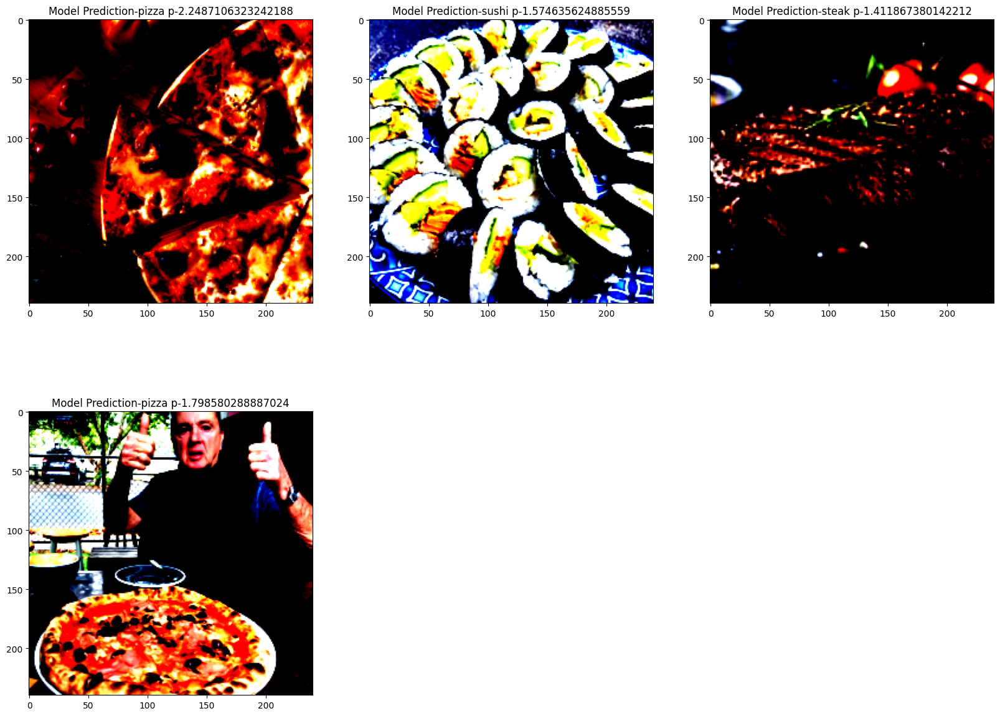

In [122]:
from PIL import Image
import matplotlib.pyplot as plt
count=1

plt.figure(figsize=(20,15))
for files in os.listdir(custom):
    img=Image.open(os.path.join(custom,files))

    img_tensor=transform(img)    # conver it into tensor



    # print(f"shape of image after conversion-- {img_tensor.unsqueeze(dim=0).shape}")
    with torch.inference_mode():
        checks=model(img_tensor.unsqueeze(dim=0).to(device))
        # print(f"Model Predicted---> {train_data.classes[torch.argmax(checks,dim=1).item()]}")

    plt.subplot(2,3,count)
    plt.imshow(img_tensor.permute(1,2,0))
    count+=1
    plt.title(f"Model Prediction-{train_data.classes[torch.argmax(checks,dim=1).item()]} p-{torch.max(checks)}")


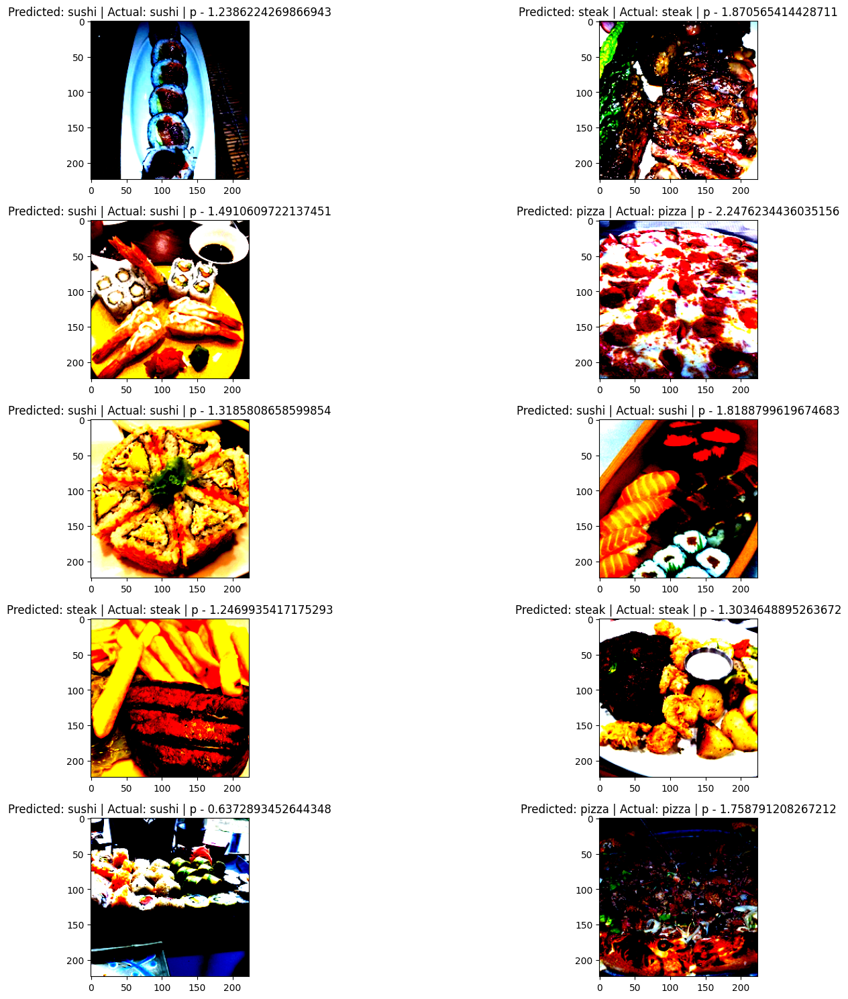

In [128]:
import random

random_indices = random.sample(range(len(test_data)), 10)
random_samples = [test_data[i] for i in random_indices]

plt.figure(figsize=(20, 15))
count = 1

for img_tensor, label in random_samples:
    with torch.inference_mode():
        checks = model(img_tensor.unsqueeze(dim=0).to(device))

    plt.subplot(5, 2, count)  # Adjusted to 5 rows and 2 columns for 10 images
    plt.imshow(img_tensor.permute(1, 2, 0).cpu().numpy())
    predicted_label = test_data.classes[torch.argmax(checks, dim=1).item()]
    actual_label = test_data.classes[label]
    plt.title(f"Predicted: {predicted_label} | Actual: {actual_label} | p - {torch.max(checks).item()}")
    count += 1

plt.tight_layout()
plt.show()
